# CSS182-03 SA2 - Implementing YOLOv26 with NMS-Free Detection
---

**Submitted by:
* Cruz, Audrize ShemKeane
* Morales, Rayleen Claire
> CS-3 / BM2

# Part 1: Environment Setup

This section prepares the Google Colab environment by installing all necessary
libraries, mounting Google Drive for persistent storage, and extracting the
dataset. Proper environment setup is critical because mismatched package
versions or incorrect file paths will cause training to fail silently or
produce unreliable results. We also verify GPU availability since YOLOv26
training without a GPU would be prohibitively slow.

In [ ]:
# Install required packages
%pip install -q "ultralytics>=8.4.0" supervision roboflow

import os
import yaml
import pandas as pd
from ultralytics import YOLO
from IPython.display import Image, display

# prevent ultralytics from tracking your activity
!yolo settings sync=False
import ultralytics
ultralytics.checks()

Ultralytics 8.4.18 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 43.7/112.6 GB disk)


In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
project_path = '/content/drive/MyDrive/2T2526/CSS182-03/YOLOv26-NMS-Free-Detection'

# 3. Change the current working directory
os.chdir(project_path)

# 4. Verify the change
print("Current Working Directory:")
!pwd
print("\nFiles in this folder:")
!ls

Current Working Directory:
/content/drive/MyDrive/2T2526/CSS182-03/YOLOv26-NMS-Free-Detection

Files in this folder:
SA2-VehicleVolume.v7-finaldataset.yolo26.zip


In [ ]:
!unzip -oq SA2-VehicleVolume.v7-finaldataset.yolo26.zip -d my_dataset

## Dataset Configuration Verification

Before training begins, we must confirm that the `data.yaml` configuration
file correctly points to the training, validation, and test image directories.
If these paths are broken or relative paths don't resolve properly after
unzipping, the model will either crash during training or train on no data at
all. This verification step saves significant debugging time later.

In [ ]:
# Set the path to the unzipped data configuration
DATA_YAML_PATH = f"{os.getcwd()}/my_dataset/data.yaml"

# Display the contents
!cat {DATA_YAML_PATH}

# Verify that train/val/test paths resolve correctly
with open(DATA_YAML_PATH) as f:
    data_cfg = yaml.safe_load(f)

base = os.path.dirname(DATA_YAML_PATH)
for split in ['train', 'val', 'test']:
    if split in data_cfg:
        full = os.path.normpath(os.path.join(base, data_cfg[split]))
        print(f"{split}: {full} -> exists: {os.path.exists(full)}")

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 6
names: ['Bike', 'Car', 'Motorcycle', 'Others', 'Tricycle', 'Truck']

roboflow:
  workspace: a-yrzhn
  project: sa2-vehiclevolume
  version: 7
  license: CC BY 4.0
  url: https://universe.roboflow.com/a-yrzhn/sa2-vehiclevolume/dataset/7train: /content/drive/MyDrive/2T2526/CSS182-03/YOLOv26-NMS-Free-Detection/train/images -> exists: False
val: /content/drive/MyDrive/2T2526/CSS182-03/YOLOv26-NMS-Free-Detection/valid/images -> exists: False
test: /content/drive/MyDrive/2T2526/CSS182-03/YOLOv26-NMS-Free-Detection/test/images -> exists: False


## GPU and Environment Verification

We verify that a GPU (NVIDIA T4 or similar) is available and accessible in
the Colab runtime. Object detection training is computationally intensive, and
running YOLOv26 on CPU alone would take hours instead of minutes per epoch.
The `HOME` variable is also set here as a convenience reference for all
subsequent file path operations.

In [ ]:
# Verify GPU access
!nvidia-smi

Fri Feb 27 19:50:06 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   39C    P8             11W /   70W |       3MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
HOME = os.getcwd()
print(f"Project Home: {HOME}")

Project Home: /content/drive/MyDrive/2T2526/CSS182-03/YOLOv26-NMS-Free-Detection


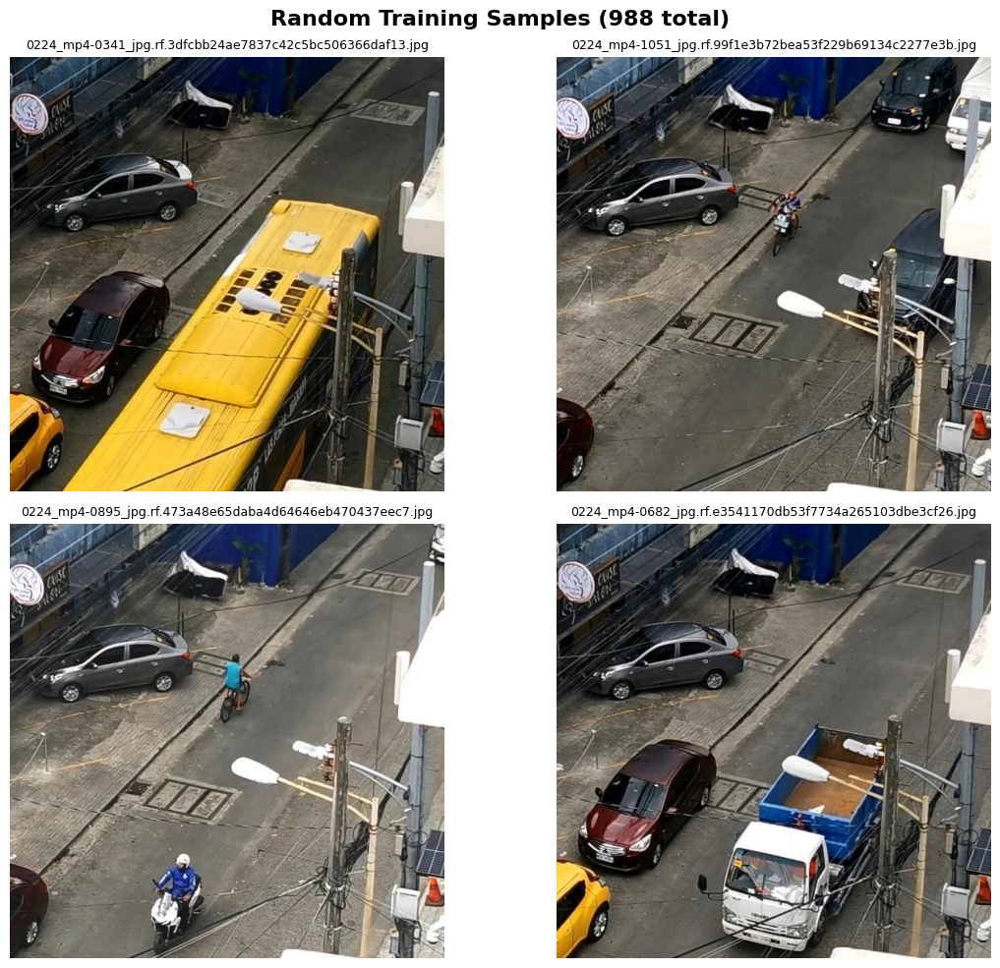

In [ ]:
import glob
import random
import matplotlib.pyplot as plt
from matplotlib.image import imread

# Collect all image paths from the training set
sample_images = glob.glob(f"{HOME}/my_dataset/train/images/*")

if sample_images:
    # Randomly pick 4 images (or fewer if dataset is smaller)
    picks = random.sample(sample_images, min(4, len(sample_images)))

    # Create a 2x2 grid with generous spacing
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    fig.suptitle(
        f'Random Training Samples ({len(sample_images)} total)',
        fontsize=16, fontweight='bold'
    )

    # Loop through each subplot and display the selected image
    for ax, img_path in zip(axes.flatten(), picks):
        img = imread(img_path)
        ax.imshow(img)
        ax.set_title(os.path.basename(img_path), fontsize=9)  # show filename
        ax.axis('off')  # hide axis ticks for a cleaner look

    plt.tight_layout()
    plt.show()
else:
    print("No images found. Check your dataset path.")

# Part 2: Model Initialization, Training & Real-time Monitoring

This is the core section of the activity where we initialize three separate
YOLOv26 nano models, each configured with a unique combination of
hyperparameters (optimizer, batch size, learning rate, and epoch count). The
goal is to observe how different training configurations affect model
convergence and final detection accuracy. TensorBoard is launched beforehand
so we can monitor loss curves and metrics in real time as each model trains.

In [ ]:
# Launch TensorBoard to view real-time performance
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

## Model 1: AdamW Optimizer with Auto-batch

Model 1 uses the AdamW optimizer, which combines Adam's adaptive learning
rates with decoupled weight decay regularization — making it a strong default
for modern deep learning. Auto-batch (`batch=-1`) lets Ultralytics
automatically determine the largest batch size that fits in GPU memory,
maximizing throughput. The relatively high learning rate of 0.01 paired with
only 25 epochs tests whether AdamW can converge quickly.

In [ ]:
# Create 3 models with different parameter setups
# Model 1: AdamW + Auto-batch
model1 = YOLO('yolo26n.pt')
model1.train(data=DATA_YAML_PATH, epochs=25, imgsz=640,
             optimizer='AdamW', batch=-1, lr0=0.01, name='model1_adamw')

Ultralytics 8.4.18 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=-1, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/2T2526/CSS182-03/YOLOv26-NMS-Free-Detection/my_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=25, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo26n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=model1_adamw, nbs=64, nms=False, opset=None, optimize=Fa

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b7afabe98b0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
     

## Model 2: SGD Optimizer with Fixed Batch Size

Model 2 uses Stochastic Gradient Descent (SGD), the classical optimizer that
updates weights using a fixed momentum-based rule rather than adaptive per-
parameter rates. A moderate batch size of 20 and a lower learning rate of
0.001 are paired with 30 epochs to give SGD more time to converge, since it
typically requires more iterations than adaptive optimizers. This setup tests
whether the simpler optimizer can match or exceed AdamW given more training
time.

In [ ]:
# Model 2: SGD + Fixed Batch 20
model2 = YOLO('yolo26n.pt')
model2.train(data=DATA_YAML_PATH, epochs=30, imgsz=640,
             optimizer='SGD', batch=20, lr0=0.001, name='model2_sgd')

Ultralytics 8.4.18 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=20, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/2T2526/CSS182-03/YOLOv26-NMS-Free-Detection/my_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo26n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=model2_sgd, nbs=64, nms=False, opset=None, optimize=Fal

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b7aaee283b0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
     

## Model 3: Auto Optimizer with Small Batch Size

Model 3 uses Ultralytics' `auto` optimizer selection, which lets the
framework choose the best optimizer internally based on the model
architecture. The very small batch size of 4 introduces more gradient noise
per step, which can act as implicit regularization but also slows convergence.
To compensate, this model trains for 40 epochs with the smallest learning
rate (0.0001), testing whether longer and more cautious training yields
better generalization.

In [ ]:
# Model 3: Auto Optimizer + Batch 4
model3 = YOLO('yolo26n.pt')
model3.train(data=DATA_YAML_PATH, epochs=40, imgsz=640,
             optimizer='auto', batch=4, lr0=0.0001, name='model3_auto')

Ultralytics 8.4.18 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/2T2526/CSS182-03/YOLOv26-NMS-Free-Detection/my_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=40, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo26n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=model3_auto, nbs=64, nms=False, opset=None, optimize=Fa

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b7afb7024b0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
     

# Part 3: Model Evaluation (The Confusion Matrix)

The confusion matrix is a fundamental diagnostic tool that shows exactly how
the model's predictions align with ground-truth labels on a per-class basis.
The diagonal cells represent correct predictions (True Positives), while off-
diagonal cells reveal specific misclassification patterns — for example,
whether the model confuses one vehicle type with another or hallucinates
objects from the background (False Positives). This analysis is essential for
understanding *where* each model fails, not just *how often*.

In [ ]:
# Function to display matrix
def show_matrix(train_name):
    path = f"{HOME}/runs/detect/{train_name}/confusion_matrix.png"
    if os.path.exists(path):
        print(f"--- Confusion Matrix: {train_name} ---")
        display(Image(filename=path, width=900))

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def show_matrix(metrics, train_name, class_names):
    # Extract the raw confusion matrix from validation results
    cm = metrics.confusion_matrix.matrix

    # Normalize per true class (rows) to show ratios instead of raw counts
    # Adding 1e-9 to avoid division by zero for classes with no samples
    cm_norm = cm / (cm.sum(axis=1, keepdims=True) + 1e-9)

    # Plot the heatmap with a green-blue color scheme
    plt.figure(figsize=(7, 5))
    sns.heatmap(
        cm_norm,
        annot=True,               # display values in each cell
        fmt='.2f',                 # format to 2 decimal places
        cmap='GnBu',              # green-blue colormap
        xticklabels=class_names + ['background'],  # predicted labels
        yticklabels=class_names + ['background'],  # true labels
        linewidths=0.5,           # thin white lines between cells
        linecolor='white',
        cbar_kws={'label': 'Ratio'}  # label for the color bar
    )
    plt.title(f'Confusion Matrix: {train_name}', fontsize=14)
    plt.xlabel('Predicted', fontsize=12)
    plt.ylabel('True', fontsize=12)
    plt.tight_layout()
    plt.show()

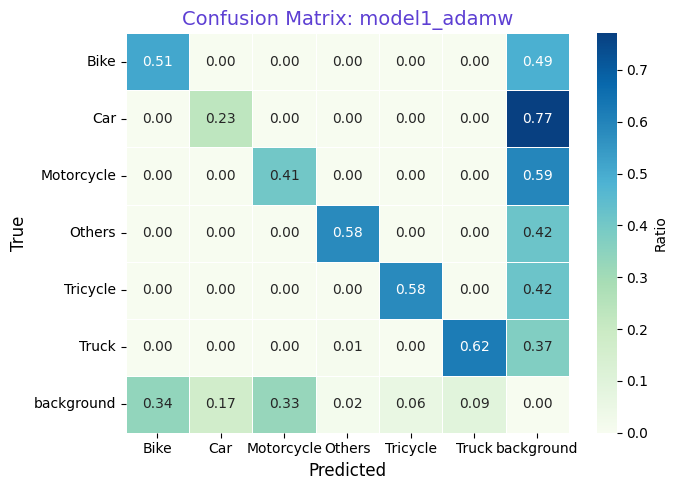

In [ ]:
# Get class names from data.yaml
with open(DATA_YAML_PATH) as f:
    class_names = yaml.safe_load(f)['names']

show_matrix(m1_metrics, 'model1_adamw', class_names)

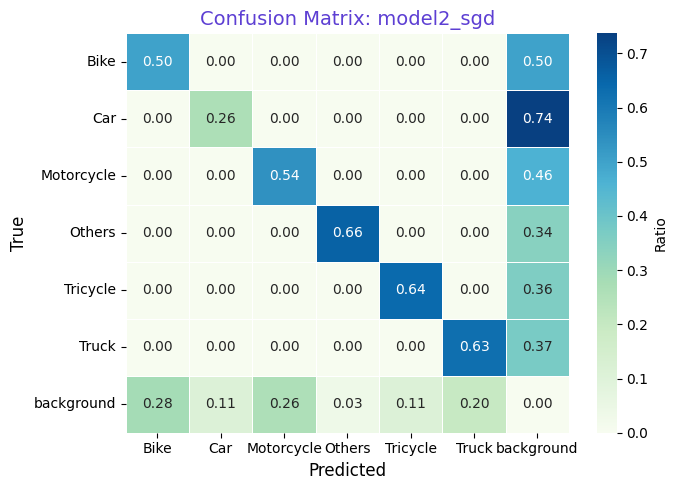

In [ ]:
show_matrix(m2_metrics, 'model2_sgd', class_names)

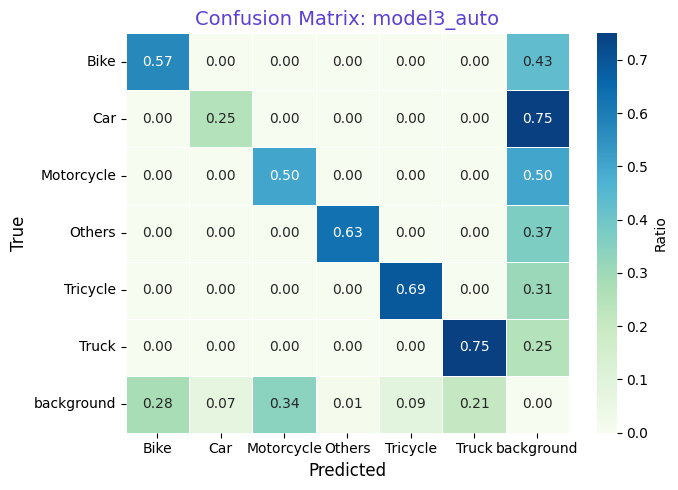

In [ ]:
show_matrix(m3_metrics, 'model3_auto', class_names)

# Part 4: Generating the Performance Table

This section extracts and presents the quantitative evaluation metrics from
each trained model using the validation dataset. We display two Pandas tables:
one summarizing the hyperparameter choices for easy comparison, and another
showing mAP50, Precision, Recall, and F1 Score. These metrics together give a
complete picture — mAP50 measures overall detection accuracy, Precision tells
us how many detections are correct, Recall tells us how many real objects were
found, and F1 balances the two.

In [ ]:
# Helper to safely compute F1 from precision and recall
def calc_f1(metrics):
    p = metrics.box.mp
    r = metrics.box.mr
    if (p + r) > 0:
        return 2 * (p * r) / (p + r)
    return 0.0

# 1. Hyperparameter Settings Table
hp_data = {
    'Model': ['Model 1', 'Model 2', 'Model 3'],
    'Optimizer': ['AdamW', 'SGD', 'auto'],
    'Batch Size': [-1, 20, 4],
    'Epochs': [25, 30, 40],
    'Learning Rate': [0.01, 0.001, 0.0001]
}
df_params = pd.DataFrame(hp_data)
print("=== Hyperparameter Settings ===")
display(df_params)

# 2. Run validation to extract metrics
m1_metrics = model1.val()
m2_metrics = model2.val()
m3_metrics = model3.val()

=== Hyperparameter Settings ===


,Model,Optimizer,Batch Size,Epochs,Learning Rate
0,Model 1,AdamW,-1,25,0.0100
1,Model 2,SGD,20,30,0.0010
2,Model 3,auto,4,40,0.0001


Ultralytics 8.4.18 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO26n summary (fused): 122 layers, 2,376,006 parameters, 0 gradients, 5.2 GFLOPs
val: Fast image access ✅ (ping: 2.9±4.9 ms, read: 26.0±17.3 MB/s, size: 71.2 KB)
val: Scanning /content/drive/MyDrive/2T2526/CSS182-03/YOLOv26-NMS-Free-Detection/my_dataset/valid/labels.cache... 283 images, 11 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 283/283 91.3Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 18/18 3.0it/s 6.0s
                   all        283        311      0.466      0.644      0.539      0.351
                  Bike         62         63      0.453      0.381       0.41      0.277
                   Car         17         34      0.257      0.559      0.293      0.194
            Motorcycle         43         52      0.371      0.272      0.337      0.166
                Others         35         35      0.545      0.914      0.66

In [ ]:
# 3. Metrics Results Table
metrics_data = {
    'Model': ['Model 1', 'Model 2', 'Model 3'],
    'mAP50': [
        m1_metrics.box.map50,
        m2_metrics.box.map50,
        m3_metrics.box.map50
    ],
    'Precision': [
        m1_metrics.box.mp,
        m2_metrics.box.mp,
        m3_metrics.box.mp
    ],
    'Recall': [
        m1_metrics.box.mr,
        m2_metrics.box.mr,
        m3_metrics.box.mr
    ],
    'F1': [
        calc_f1(m1_metrics),
        calc_f1(m2_metrics),
        calc_f1(m3_metrics)
    ]
}
df_metrics = pd.DataFrame(metrics_data)
print("\n=== Performance Metrics ===")
display(df_metrics)


=== Performance Metrics ===


,Model,mAP50,Precision,Recall,F1
0,Model 1,0.538790,0.465989,0.643965,0.540708
1,Model 2,0.455917,0.486915,0.500592,0.493659
2,Model 3,0.686369,0.635435,0.673688,0.654003


# Part 5: Model Comparison and Discussion

This final section ties together all the quantitative results and visual
diagnostics into a cohesive analysis. The goal is to move beyond raw numbers
and explain *why* each model performed the way it did based on its
hyperparameter choices, and to make a practical recommendation about
deployment readiness. This discussion is the most important deliverable
because it demonstrates understanding of the training process, not just the
ability to run code.

## Per-class Analysis
[Discuss which classes each model struggled with based on confusion matrices.
Look at the off-diagonal values — which classes get confused with each other?
Does any model misclassify background as an object (false positives)?]

## Metric Comparison
[Compare precision, recall, mAP50, and F1 across the 3 models.
Why might one model have higher precision but lower recall?
How do optimizer choice, batch size, epochs, and learning rate affect results?]

## Deployment Readiness
[Based on F1 and mAP50, is any model ready for real-world deployment?
What thresholds would you consider acceptable?
What further improvements could be made (more data, more epochs, augmentation, larger model)?]